In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.applications import VGG19
from PIL import Image
import  matplotlib.pyplot as plt
%matplotlib inline

In [2]:
image_size= 512

In [3]:
vgg19 = VGG19(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))
for layer in vgg19.layers:
    print(layer.name)
vgg19.trainable = False

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [4]:
LAYERS= [
    ('block1_conv1', 0.1),
    ('block2_conv1', 0.15),
    ('block3_conv1', 0.15),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.4),
    ('block5_conv4', 1)
]

In [5]:
def get_layers_output(model, layer_names):
    outputs = [model.get_layer(layer[0]).output for layer in layer_names]
    return Model(inputs=model.input, outputs=outputs)

In [6]:
content_image= np.array(Image.open("Files/images/louvre.jpg").resize((image_size,image_size)))
content_image= tf.constant(np.reshape(content_image, (1,)+content_image.shape))
content_image.dtype

tf.uint8

In [7]:
content_image.shape

TensorShape([1, 512, 512, 3])

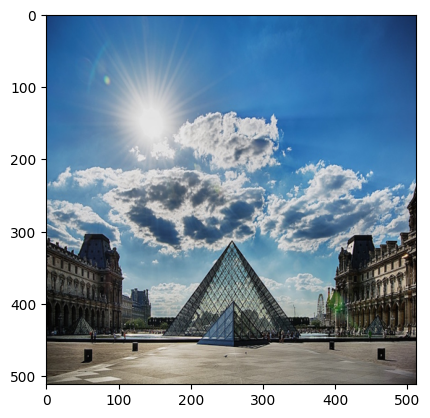

In [8]:
plt.imshow(content_image[0])
plt.show()

In [9]:
style_image = np.array(Image.open("Files/images/monet.jpg").resize((image_size,image_size)))
style_image= tf.constant(np.reshape(style_image, (1,)+style_image.shape))
style_image.dtype

tf.uint8

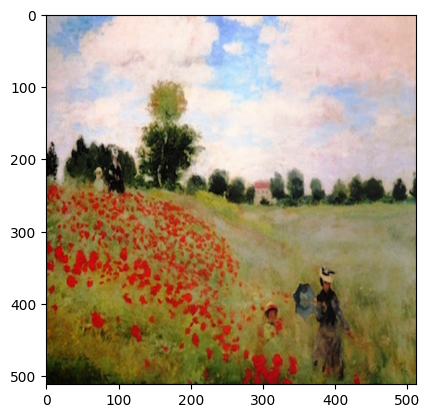

In [10]:
plt.imshow(style_image[0])
plt.show()

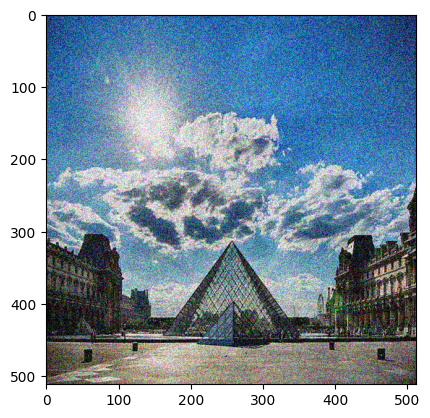

In [11]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, dtype=tf.float32))
noise= tf.random.uniform(shape= tf.shape(generated_image), minval=-0.25, maxval= 0.25)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min= 0,clip_value_max= 1)

plt.imshow(generated_image[0])
plt.show()
generated_image = tf.Variable(generated_image)

In [12]:
model_outputs = get_layers_output(vgg19, LAYERS)

In [13]:
a_S= tf.Variable(tf.image.convert_image_dtype(style_image, dtype= tf.float32))
a_S = model_outputs(a_S)

In [14]:
a_C = tf.Variable(tf.image.convert_image_dtype(content_image, dtype= tf.float32))
a_C = model_outputs(a_C)

In [15]:
def tensor_to_image(tensor):
    image= np.array(tensor*255)
    if image.ndim > 3:
        assert image.shape[0] == 1
        image = image[0]

    return Image.fromarray(image)

In [16]:
def content_cost(content_image_outputs, generated_image_outputs):
    a_C = content_image_outputs[-1]
    a_G = generated_image_outputs[-1]

    _,n_H,n_W,n_C = a_C.get_shape().as_list()

    a_C = tf.transpose(tf.reshape(a_C, shape= [1,-1, n_C]), perm= [0,2,1])
    a_G = tf.transpose(tf.reshape(a_G, shape= [1,-1, n_C]), perm= [0,2,1])

    norm_term = 4*n_H*n_W*n_C
    cost = tf.reduce_sum(tf.square(tf.subtract(a_G, a_C))) / norm_term
    return cost

In [17]:
def gram_matrix(A):
    return tf.matmul(A, tf.transpose(A))

In [18]:
def layer_style_cost(a_S, a_G):
    _,n_H,n_W,n_C = a_S.get_shape().as_list()

    a_S = tf.transpose(tf.reshape(a_S, shape= [-1, n_C]))
    a_G = tf.transpose(tf.reshape(a_G, shape= [-1, n_C]))

    GS = gram_matrix(a_S)
    GG = gram_matrix(a_G)

    norm_term =(2*n_H*n_W*n_C)**2
    cost = tf.reduce_sum(tf.square(tf.subtract(GS, GG)))/norm_term

    return cost


In [19]:
def style_cost(style_image_outputs, generated_image_outputs, layers):
    a_S = style_image_outputs[:-1]
    a_G = generated_image_outputs[:-1]

    cost = 0

    for i, weight in enumerate(layers[:-1]):
        cost += weight[1]*layer_style_cost(a_S[i], a_G[i])
    return cost

In [20]:
def total_cost(style_cost, content_cost, alpha= 10, beta= 40):

    return alpha*content_cost + beta*style_cost

In [21]:
def train_step(generated_image, a_S, a_C, optimizer):
    with tf.GradientTape() as tape:
        tape.watch(generated_image)
        a_G = model_outputs(generated_image)

        cont_cost = content_cost(a_C, a_G)
        st_cost = style_cost(a_S, a_G, LAYERS)
        cost = total_cost(cont_cost, st_cost)
    gradient= tape.gradient(cost, generated_image)
    optimizer.apply_gradients([(gradient, generated_image)])
    generated_image.assign(tf.clip_by_value(generated_image, clip_value_min= 0,clip_value_max=1))

In [22]:
def train_model(generated_image, epochs, optimizer, save_path):
    image= 0
    for epoch in range(epochs):
        train_step(generated_image, a_S, a_C, optimizer)
        if (epoch)%250 == 0:
            print(f"epoch= {epoch+1} / {epochs}")
            image= np.array(generated_image*255, dtype= np.uint8)[0]
            plt.imshow(image)
            plt.show()
    print(image.shape)
    image = Image.fromarray(image)
    image.save(save_path)
    return image

In [23]:
print("GPUs Available:", tf.config.list_physical_devices('GPU'))

GPUs Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


epoch= 1 / 2500


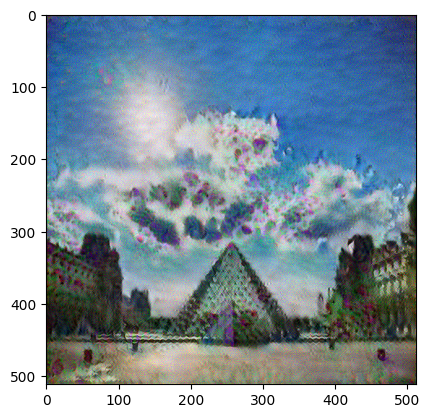

epoch= 251 / 2500


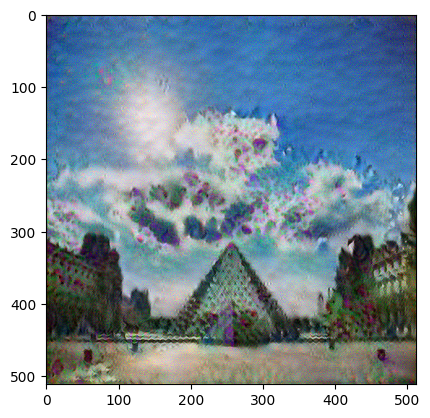

epoch= 501 / 2500


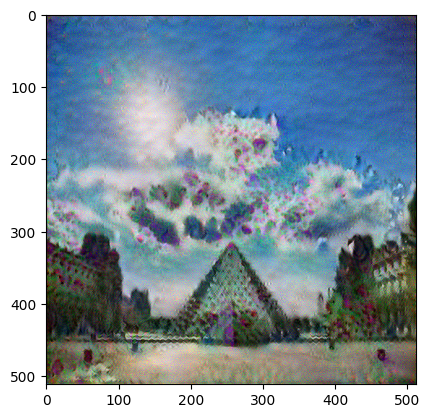

epoch= 751 / 2500


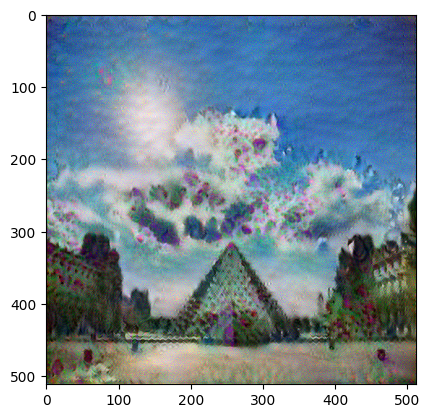

epoch= 1001 / 2500


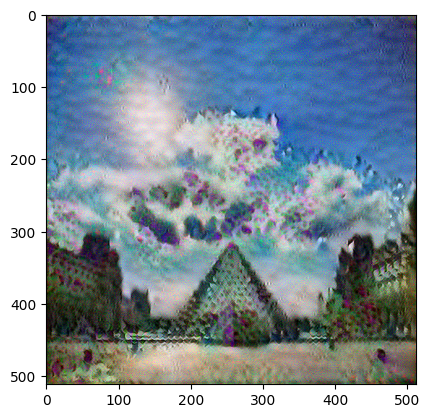

epoch= 1251 / 2500


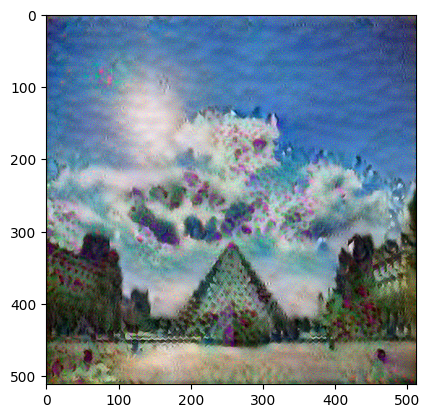

epoch= 1501 / 2500


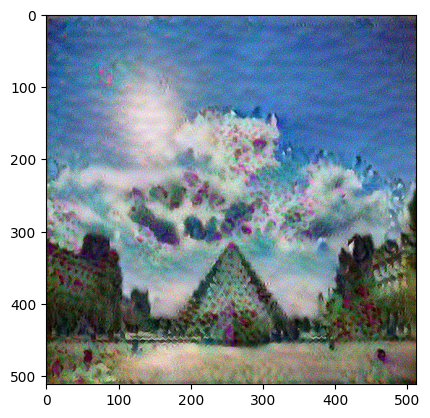

epoch= 1751 / 2500


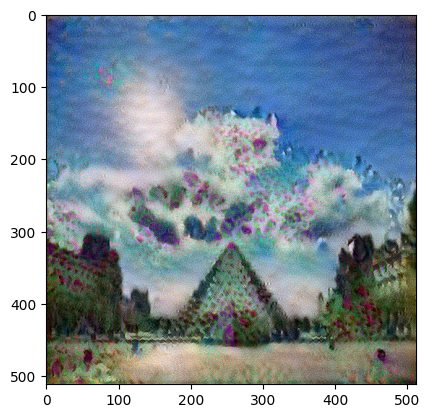

epoch= 2001 / 2500


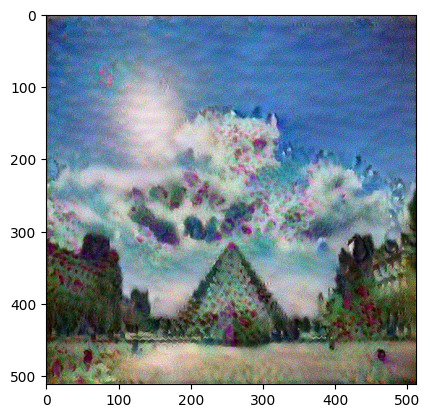

epoch= 2251 / 2500


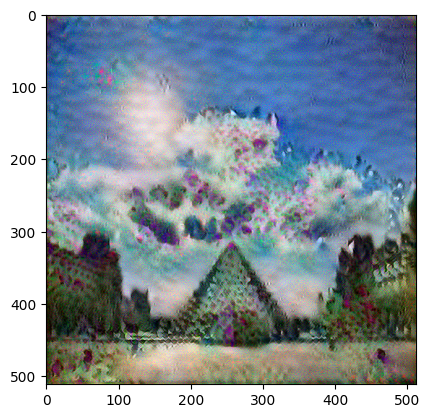

(512, 512, 3)


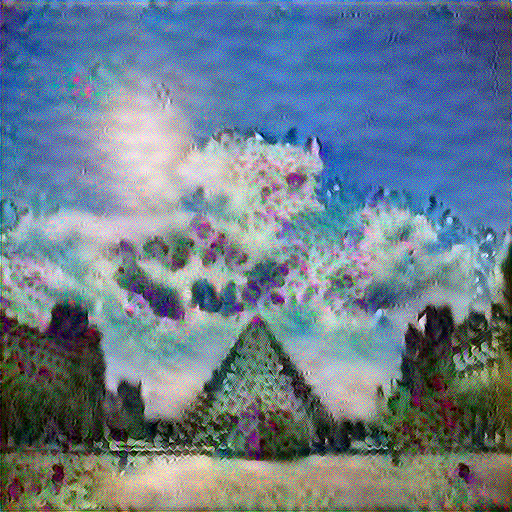

In [26]:
train_model(generated_image, epochs= 2500, optimizer= tf.keras.optimizers.Adam(learning_rate= 0.01), save_path= "Files/images/blended.jpg")

epoch= 1 / 1


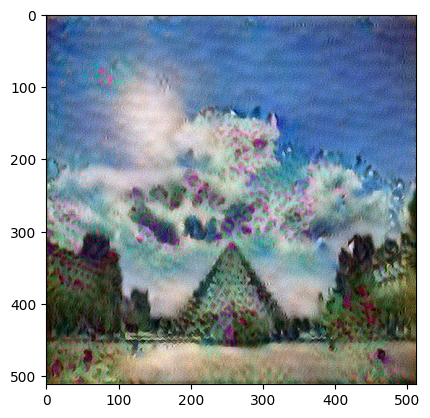

(512, 512, 3)


In [27]:
image= train_model(generated_image, epochs= 1, optimizer= tf.keras.optimizers.Adam(learning_rate= 0.01), save_path= "Files/images/cat_water.jpg")

In [28]:
image= image.resize(Image.open("Files/images/louvre.jpg").size)
image.save("Files/images/louvre_blend_resized.jpg")

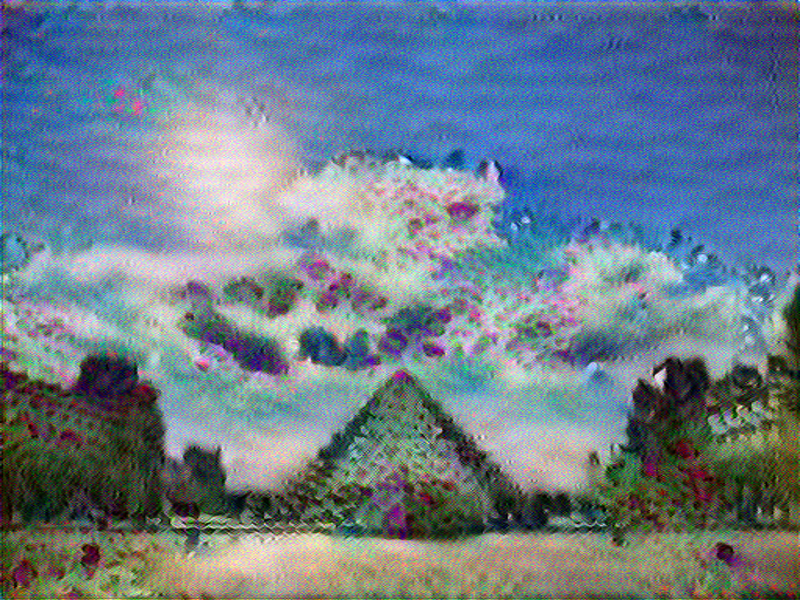

In [29]:
image

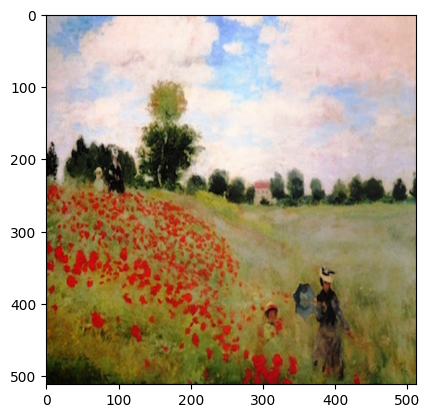

In [30]:
plt.imshow(style_image[0])
plt.show()

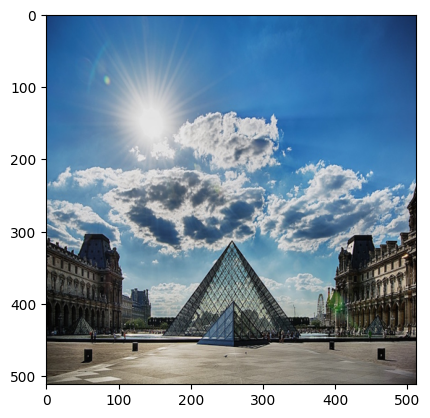

In [31]:
plt.imshow(content_image[0])
plt.show()

In [32]:
a=np.array(content_image[0])
b=np.array(style_image[0])
print(f"a shape= {a.shape} and b shape= {b.shape}")


a shape= (512, 512, 3) and b shape= (512, 512, 3)


In [33]:
a = tf.constant(tf.image.convert_image_dtype(a,dtype= tf.float32))
b = tf.constant(tf.image.convert_image_dtype(b,dtype= tf.float32))

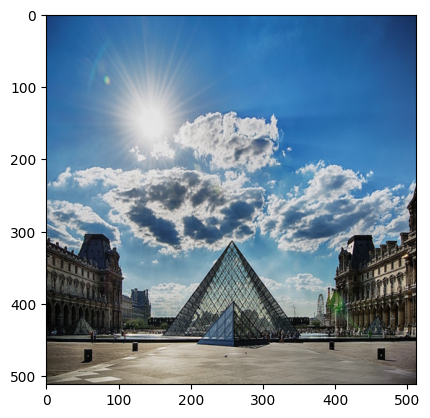

In [34]:
plt.imshow(a)
plt.show()

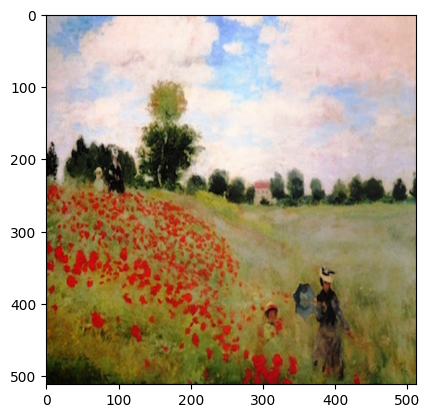

In [35]:
plt.imshow(b)
plt.show()

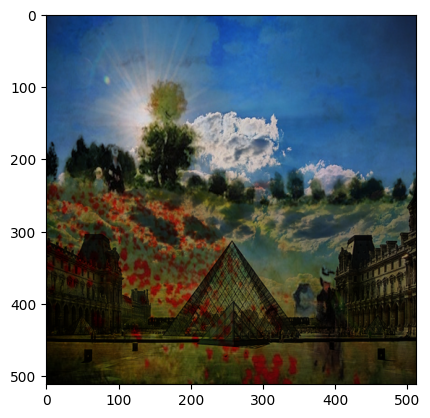

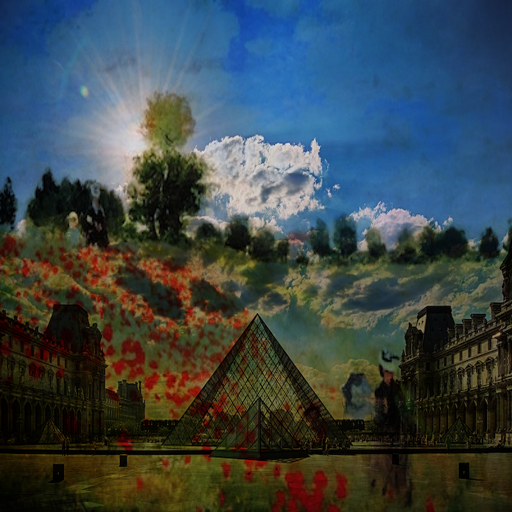

In [36]:
res = tf.multiply(a,b)
plt.imshow(res)
plt.show()

img = Image.fromarray(np.array(res*255, dtype= np.uint8))
img

In [37]:
img.save("Files/images/louvre_blend_resized.jpg")